In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory
a=[]
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        a.append(os.path.join(dirname, filename))
        


# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
len(a)

# Lib

In [2]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from keras.utils import to_categorical
import os
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense
from keras.initializers import glorot_normal
from keras.applications import ResNet50
from keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [50]:

# # Define paths
train_dir_cleaned = '/kaggle/input/data001/train/train'
test_dir_cleaned = '/kaggle/input/data001/s_test'

# train_dir='/kaggle/input/state-farm-distracted-driver-detection/imgs/train'
# test_dir='/kaggle/input/state-farm-distracted-driver-detection/imgs/test'


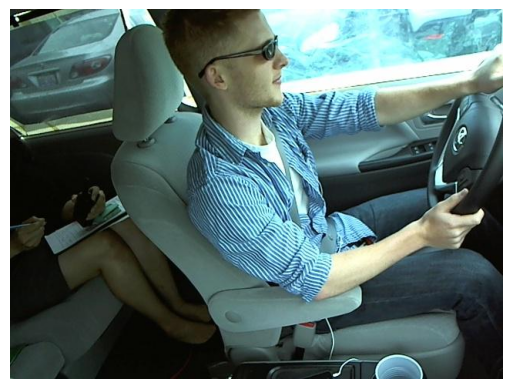

In [42]:
# pic_link='/kaggle/input/data001/s_test/img_1.jpg'
pic_link='/kaggle/input/state-farm-distracted-driver-detection/imgs/train/c0/img_100026.jpg'  

img = mpimg.imread(pic_link)

plt.imshow(img)
plt.axis('off') 
plt.show()


In [43]:
class_names = {
    'c0': 'normal driving',
    'c1': 'texting - right',
    'c2': 'talking on the phone - right',
    'c3': 'texting - left',
    'c4': 'talking on the phone - left',
    'c5': 'operating the radio',
    'c6': 'drinking',
    'c7': 'reaching behind',
    'c8': 'hair and makeup',
    'c9': 'talking to passenger'
}



# Split the data

In [6]:
# train_datagen = ImageDataGenerator(
#     rescale=1./255,
#     validation_split=0.1  # 10% validation split
# )

# # Generate batches of augmented data from the train directory
# train_generator = train_datagen.flow_from_directory(
#     train_dir,
#     target_size=(224,224),
#     batch_size=32,
#     class_mode='categorical',
#     subset='training'  # Specify this as training set
# )

# # Generate batches of validation data from the same directory
# validation_generator = train_datagen.flow_from_directory(
#     train_dir,
#     target_size=(224,224),
#     batch_size=32,
#     class_mode='categorical',
#     subset='validation'  # Specify this as validation set
# )


Found 20187 images belonging to 10 classes.
Found 2237 images belonging to 10 classes.


In [7]:
len(train_dir)

63

In [51]:
train_generator_clean = train_datagen.flow_from_directory(
    train_dir_cleaned,
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical',
    subset='training'  # Specify this as training set
)

# Generate batches of validation data from the same directory
validation_generator_clean = train_datagen.flow_from_directory(
    train_dir_cleaned,
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical',
    subset='validation'  # Specify this as validation set
)

Found 1053 images belonging to 10 classes.
Found 112 images belonging to 10 classes.


In [52]:
len(train_dir_cleaned)

33

# **ANN model**

In [39]:
model = Sequential([
    Flatten(input_shape=(224, 224, 3)),
    Dense(1024, activation='relu'),
    Dense(512, activation='relu'),
    Dense(256, activation='relu'),
    Dense(10, activation='softmax')
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(train_generator, epochs=5, validation_data=validation_generator)

# Evaluate the model on the validation data
val_loss, val_acc = model.evaluate(validation_generator)
print(f"Validation accuracy: {val_acc}")

Epoch 1/5
  1/631 ━━━━━━━━━━━━━━━━━━━━ 45:27 4s/step - accuracy: 0.1562 - loss: 2.2557

W0000 00:00:1715420640.021882     289 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


143/631 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - accuracy: 0.1558 - loss: 37.3936

W0000 00:00:1715420657.699314     287 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


630/631 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - accuracy: 0.4049 - loss: 14.0634

W0000 00:00:1715420707.601773     286 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


631/631 ━━━━━━━━━━━━━━━━━━━━ 79s 118ms/step - accuracy: 0.4056 - loss: 14.0318 - val_accuracy: 0.9173 - val_loss: 0.2955
Epoch 2/5


W0000 00:00:1715420714.698682     288 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


631/631 ━━━━━━━━━━━━━━━━━━━━ 69s 107ms/step - accuracy: 0.8853 - loss: 0.3700 - val_accuracy: 0.8695 - val_loss: 0.3812
Epoch 3/5
631/631 ━━━━━━━━━━━━━━━━━━━━ 70s 109ms/step - accuracy: 0.9285 - loss: 0.2218 - val_accuracy: 0.9611 - val_loss: 0.1168
Epoch 4/5
631/631 ━━━━━━━━━━━━━━━━━━━━ 72s 113ms/step - accuracy: 0.9112 - loss: 0.2795 - val_accuracy: 0.9540 - val_loss: 0.1463
Epoch 5/5
631/631 ━━━━━━━━━━━━━━━━━━━━ 70s 110ms/step - accuracy: 0.9521 - loss: 0.1433 - val_accuracy: 0.9030 - val_loss: 0.3035
70/70 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - accuracy: 0.9058 - loss: 0.2959
Validation accuracy: 0.9029951095581055


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


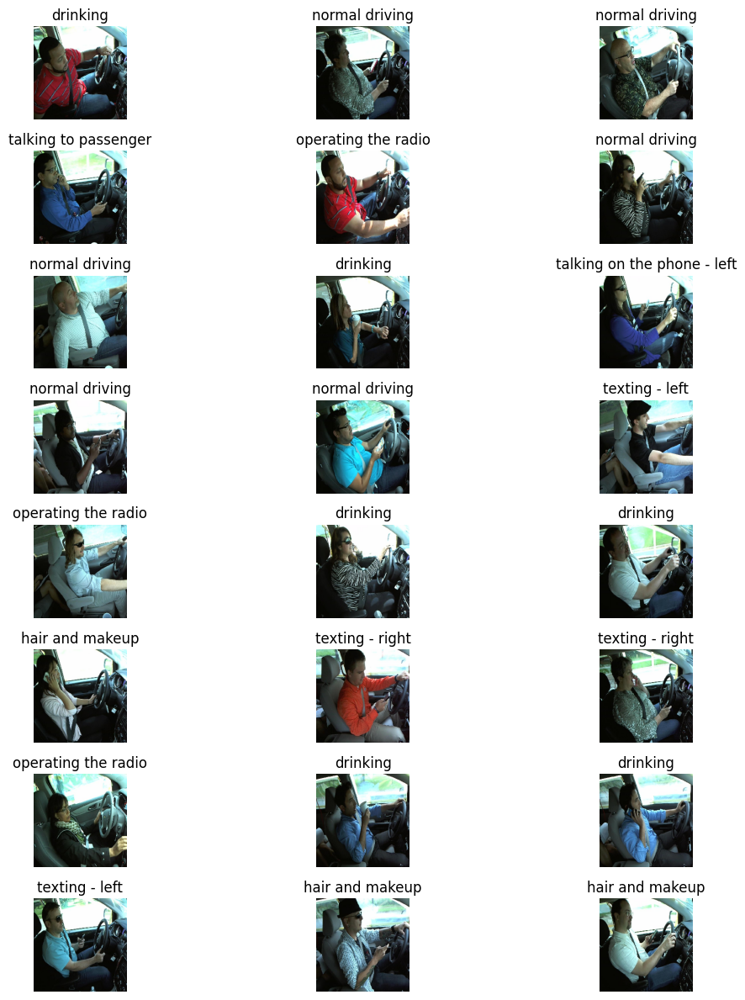

In [40]:
directory = '/kaggle/input/data001/s_test'
num_rows = len(os.listdir(directory))
num_cols = 3
fig, axs = plt.subplots(num_rows // num_cols, num_cols, figsize=(12, 12))  # Increase figsize here

# Loop through each file in the directory
for i, filename in enumerate(os.listdir(directory)):
    if filename.endswith(".jpg") or filename.endswith(".jpeg") or filename.endswith(".png"):
        # Load and preprocess the image
        img_path = os.path.join(directory, filename)
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array /= 255.  # Normalize the image

        # Predict the class probabilities
        predictions = model.predict(np.expand_dims(img_array, axis=0))
        predicted_class = np.argmax(predictions)
        predicted_label = class_names[f'c{predicted_class}']  # Retrieve class name from dictionary

        # Display the image in the grid
        row, col = divmod(i, num_cols)
        axs[row, col].imshow(img)
        axs[row, col].set_title(predicted_label)
        axs[row, col].axis('off')

plt.tight_layout()
plt.show()

In [56]:
model = Sequential([
    Flatten(input_shape=(224, 224, 3)),
    Dense(1024, activation='relu'),
    Dense(512, activation='relu'),
    Dense(256, activation='relu'),
    Dense(10, activation='softmax')
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(train_generator_clean, epochs=10, validation_data=validation_generator_clean)

# Evaluate the model on the validation data
val_loss, val_acc = model.evaluate(validation_generator_clean)
print(f"Validation accuracy: {val_acc}")

Epoch 1/10
 1/33 ━━━━━━━━━━━━━━━━━━━━ 1:27 3s/step - accuracy: 0.0625 - loss: 2.4300

W0000 00:00:1715422609.001167     287 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


22/33 ━━━━━━━━━━━━━━━━━━━━ 2s 202ms/step - accuracy: 0.0948 - loss: 73.9064

W0000 00:00:1715422613.156699     286 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


32/33 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - accuracy: 0.1001 - loss: 68.6711

W0000 00:00:1715422614.742545     287 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


33/33 ━━━━━━━━━━━━━━━━━━━━ 9s 191ms/step - accuracy: 0.1008 - loss: 67.6464 - val_accuracy: 0.1161 - val_loss: 18.4552
Epoch 2/10


W0000 00:00:1715422615.148218     287 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - accuracy: 0.1538 - loss: 8.3886 - val_accuracy: 0.2411 - val_loss: 2.8386
Epoch 3/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 108ms/step - accuracy: 0.3057 - loss: 2.5490 - val_accuracy: 0.2946 - val_loss: 2.5626
Epoch 4/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - accuracy: 0.4225 - loss: 1.8037 - val_accuracy: 0.4107 - val_loss: 2.3390
Epoch 5/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.5025 - loss: 1.6269 - val_accuracy: 0.3036 - val_loss: 2.2682
Epoch 6/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - accuracy: 0.5900 - loss: 1.2501 - val_accuracy: 0.4643 - val_loss: 1.6306
Epoch 7/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - accuracy: 0.6440 - loss: 1.0613 - val_accuracy: 0.4821 - val_loss: 1.7137
Epoch 8/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - accuracy: 0.6482 - loss: 1.0165 - val_accuracy: 0.4732 - val_loss: 1.6176
Epoch 9/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 104ms/step - accuracy: 0.7340 - loss: 0.8399 - val_accuracy: 0.5179 - val_lo

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


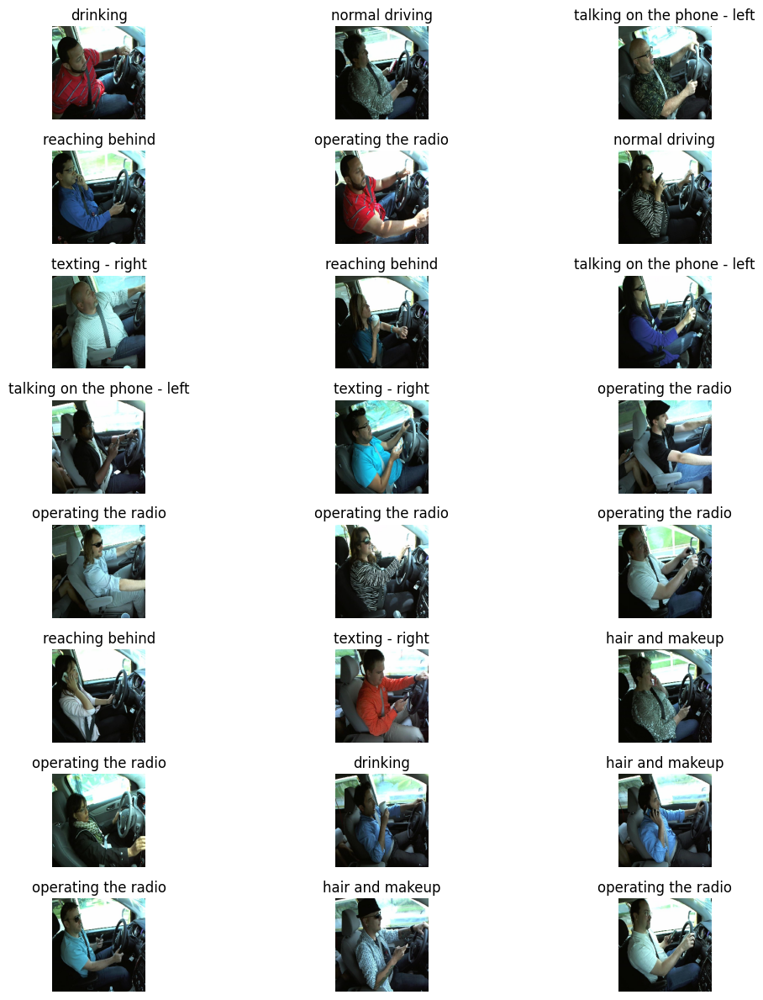

In [57]:
directory = '/kaggle/input/data001/s_test'
num_rows = len(os.listdir(directory))
num_cols = 3
fig, axs = plt.subplots(num_rows // num_cols, num_cols, figsize=(12, 12))  # Increase figsize here

# Loop through each file in the directory
for i, filename in enumerate(os.listdir(directory)):
    if filename.endswith(".jpg") or filename.endswith(".jpeg") or filename.endswith(".png"):
        # Load and preprocess the image
        img_path = os.path.join(directory, filename)
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array /= 255.  # Normalize the image

        # Predict the class probabilities
        predictions = model.predict(np.expand_dims(img_array, axis=0))
        predicted_class = np.argmax(predictions)
        predicted_label = class_names[f'c{predicted_class}']  # Retrieve class name from dictionary

        # Display the image in the grid
        row, col = divmod(i, num_cols)
        axs[row, col].imshow(img)
        axs[row, col].set_title(predicted_label)
        axs[row, col].axis('off')

plt.tight_layout()
plt.show()

# CNN

In [10]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.initializers import glorot_normal

def create_cnn_model(input_shape, num_classes):
    model = models.Sequential()

    model.add(layers.Conv2D(filters=64, kernel_size=2, activation='relu', input_shape=input_shape, kernel_initializer=glorot_normal()))
    model.add(layers.MaxPooling2D(pool_size=2))
    model.add(layers.Conv2D(filters=128, kernel_size=2, activation='relu'))
    model.add(layers.MaxPooling2D(pool_size=2))
    model.add(layers.Conv2D(filters=256, kernel_size=2, activation='relu'))
    model.add(layers.MaxPooling2D(pool_size=2))
    model.add(layers.Conv2D(filters=512, kernel_size=2, activation='relu'))
    model.add(layers.MaxPooling2D(pool_size=2))
    model.add(layers.Dropout(0.5))
    model.add(layers.Flatten())
    model.add(layers.Dense(500, activation='relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(num_classes, activation='softmax'))

    return model

input_shape = (224, 224, 3)
# Define number of classes (e.g., 10 for MNIST digits classification)
num_classes = 10

# Create the CNN model
model = create_cnn_model(input_shape, num_classes)

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Print model summary
model.summary()


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 223, 223, 64)   │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 110, 110, 128)  │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 55, 55, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 54, 54, 256)    │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 27, 27, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 26, 26, 512)    │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 13, 13, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 13, 13, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 500)            │    43,264,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 500)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         5,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 43,959,366 (167.69 MB)

 Trainable params: 43,959,366 (167.69 MB)

 Non-trainable params: 0 (0.00 B)

In [21]:
# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(train_generator, epochs=5, validation_data=validation_generator)


Epoch 1/5
631/631 ━━━━━━━━━━━━━━━━━━━━ 104s 148ms/step - accuracy: 0.9143 - loss: 0.3180 - val_accuracy: 0.9446 - val_loss: 0.1960
Epoch 2/5
631/631 ━━━━━━━━━━━━━━━━━━━━ 86s 135ms/step - accuracy: 0.9360 - loss: 0.2270 - val_accuracy: 0.9441 - val_loss: 0.1929
Epoch 3/5
631/631 ━━━━━━━━━━━━━━━━━━━━ 79s 125ms/step - accuracy: 0.9489 - loss: 0.1763 - val_accuracy: 0.8882 - val_loss: 0.3348
Epoch 4/5
631/631 ━━━━━━━━━━━━━━━━━━━━ 77s 121ms/step - accuracy: 0.9508 - loss: 0.1638 - val_accuracy: 0.9173 - val_loss: 0.2621
Epoch 5/5
631/631 ━━━━━━━━━━━━━━━━━━━━ 72s 113ms/step - accuracy: 0.9583 - loss: 0.1395 - val_accuracy: 0.9477 - val_loss: 0.1795


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


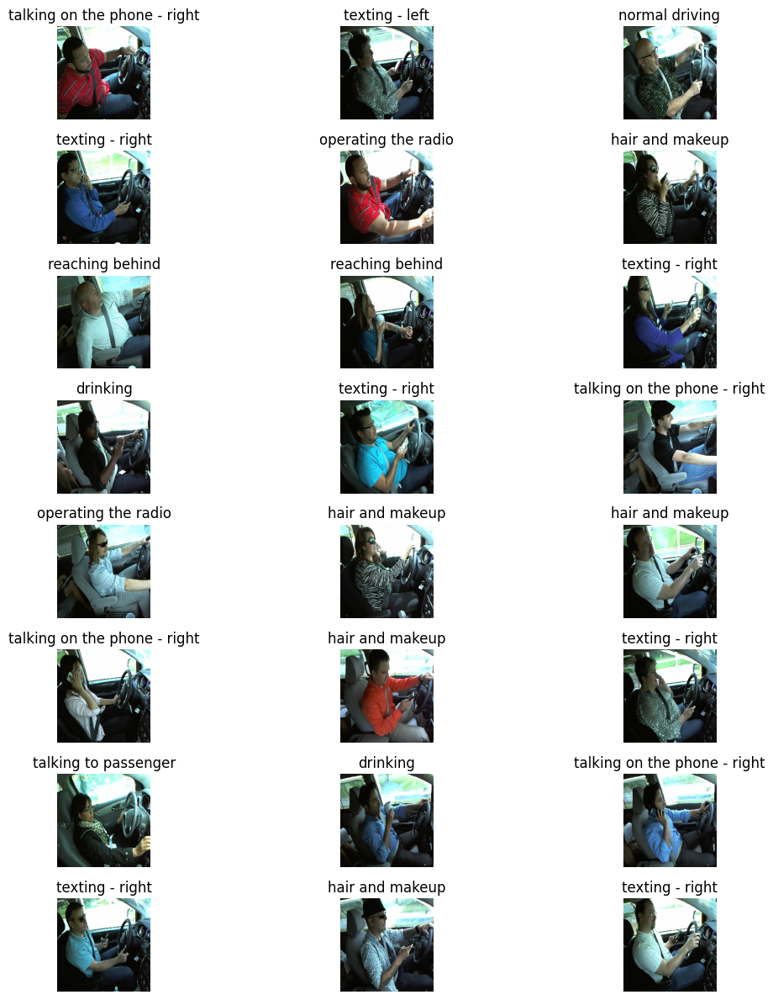

In [33]:
directory = '/kaggle/input/data001/s_test'
num_rows = len(os.listdir(directory))
num_cols = 3
fig, axs = plt.subplots(num_rows // num_cols, num_cols, figsize=(12, 12))  # Increase figsize here

# Loop through each file in the directory
for i, filename in enumerate(os.listdir(directory)):
    if filename.endswith(".jpg") or filename.endswith(".jpeg") or filename.endswith(".png"):
        # Load and preprocess the image
        img_path = os.path.join(directory, filename)
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array /= 255.  # Normalize the image

        # Predict the class probabilities
        predictions = model.predict(np.expand_dims(img_array, axis=0))
        predicted_class = np.argmax(predictions)
        predicted_label = class_names[f'c{predicted_class}']  # Retrieve class name from dictionary

        # Display the image in the grid
        row, col = divmod(i, num_cols)
        axs[row, col].imshow(img)
        axs[row, col].set_title(predicted_label)
        axs[row, col].axis('off')

plt.tight_layout()
plt.show()

In [58]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.initializers import glorot_normal

def create_cnn_model(input_shape, num_classes):
    model = models.Sequential()

    model.add(layers.Conv2D(filters=64, kernel_size=2, activation='relu', input_shape=input_shape, kernel_initializer=glorot_normal()))
    model.add(layers.MaxPooling2D(pool_size=2))
    model.add(layers.Conv2D(filters=128, kernel_size=2, activation='relu'))
    model.add(layers.MaxPooling2D(pool_size=2))
    model.add(layers.Conv2D(filters=256, kernel_size=2, activation='relu'))
    model.add(layers.MaxPooling2D(pool_size=2))
    model.add(layers.Conv2D(filters=512, kernel_size=2, activation='relu'))
    model.add(layers.MaxPooling2D(pool_size=2))
    model.add(layers.Dropout(0.5))
    model.add(layers.Flatten())
    model.add(layers.Dense(500, activation='relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(num_classes, activation='softmax'))

    return model

input_shape = (224, 224, 3)
# Define number of classes (e.g., 10 for MNIST digits classification)
num_classes = 10

# Create the CNN model
model = create_cnn_model(input_shape, num_classes)

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Print model summary
model.summary()


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 223, 223, 64)   │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 111, 111, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 110, 110, 128)  │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 55, 55, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 54, 54, 256)    │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 27, 27, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 26, 26, 512)    │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 13, 13, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 13, 13, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_12 (Flatten)            │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 500)            │    43,264,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 500)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 10)             │         5,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 43,959,366 (167.69 MB)

 Trainable params: 43,959,366 (167.69 MB)

 Non-trainable params: 0 (0.00 B)

In [59]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(train_generator_clean, epochs=10, validation_data=validation_generator_clean)

Epoch 1/10
 1/33 ━━━━━━━━━━━━━━━━━━━━ 3:23 6s/step - accuracy: 0.0938 - loss: 2.3232

W0000 00:00:1715422855.614327     286 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


17/33 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.1113 - loss: 2.4653  

W0000 00:00:1715422871.727659     288 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 555ms/step - accuracy: 0.1149 - loss: 2.4076

W0000 00:00:1715422874.367165     289 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


33/33 ━━━━━━━━━━━━━━━━━━━━ 28s 680ms/step - accuracy: 0.1152 - loss: 2.4054 - val_accuracy: 0.1339 - val_loss: 2.2742
Epoch 2/10


W0000 00:00:1715422877.505469     287 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


33/33 ━━━━━━━━━━━━━━━━━━━━ 5s 117ms/step - accuracy: 0.1614 - loss: 2.2618 - val_accuracy: 0.1875 - val_loss: 2.2090
Epoch 3/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - accuracy: 0.2383 - loss: 2.0999 - val_accuracy: 0.3750 - val_loss: 1.8770
Epoch 4/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - accuracy: 0.4890 - loss: 1.5502 - val_accuracy: 0.5179 - val_loss: 1.5405
Epoch 5/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - accuracy: 0.6100 - loss: 1.1552 - val_accuracy: 0.5625 - val_loss: 1.3156
Epoch 6/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - accuracy: 0.7015 - loss: 0.8766 - val_accuracy: 0.6607 - val_loss: 1.1004
Epoch 7/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 8s 209ms/step - accuracy: 0.7921 - loss: 0.6242 - val_accuracy: 0.6786 - val_loss: 1.0712
Epoch 8/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 9s 211ms/step - accuracy: 0.8366 - loss: 0.4730 - val_accuracy: 0.6875 - val_loss: 1.0578
Epoch 9/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 8s 207ms/step - accuracy: 0.8572 - loss: 0.3984 - val_accuracy: 0.7143 - val_

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


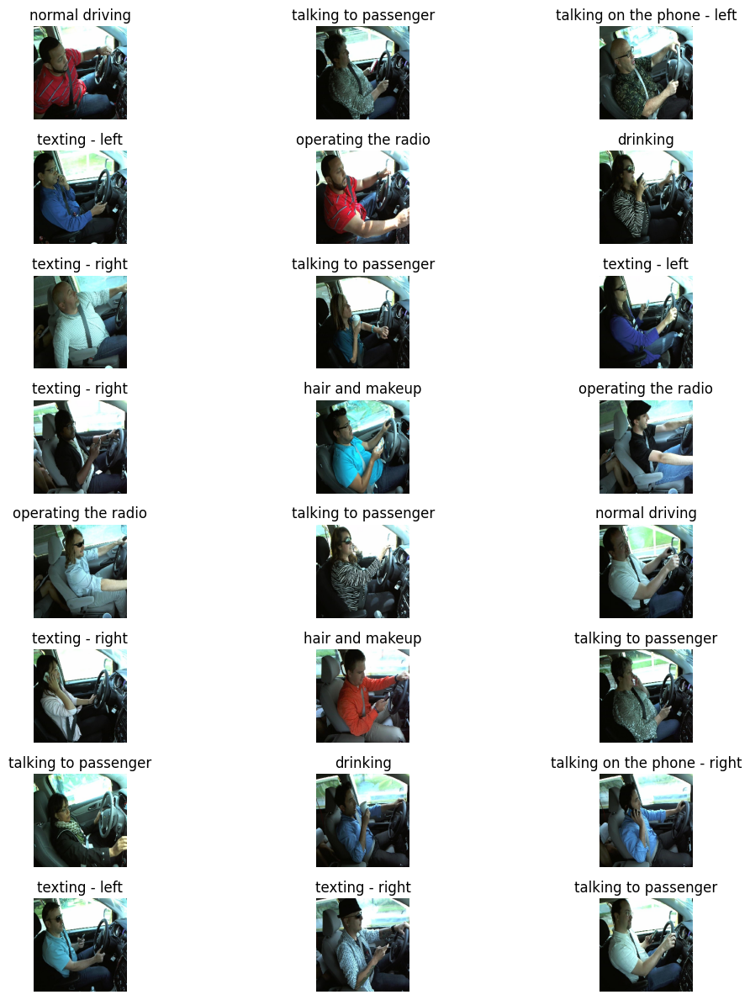

In [60]:
directory = '/kaggle/input/data001/s_test'
num_rows = len(os.listdir(directory))
num_cols = 3
fig, axs = plt.subplots(num_rows // num_cols, num_cols, figsize=(12, 12))  # Increase figsize here

# Loop through each file in the directory
for i, filename in enumerate(os.listdir(directory)):
    if filename.endswith(".jpg") or filename.endswith(".jpeg") or filename.endswith(".png"):
        # Load and preprocess the image
        img_path = os.path.join(directory, filename)
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array /= 255.  # Normalize the image

        # Predict the class probabilities
        predictions = model.predict(np.expand_dims(img_array, axis=0))
        predicted_class = np.argmax(predictions)
        predicted_label = class_names[f'c{predicted_class}']  # Retrieve class name from dictionary

        # Display the image in the grid
        row, col = divmod(i, num_cols)
        axs[row, col].imshow(img)
        axs[row, col].set_title(predicted_label)
        axs[row, col].axis('off')

plt.tight_layout()
plt.show()

# pretrained model

In [36]:
from tensorflow.keras.optimizers import Adam

# Define the pre-trained ResNet50 model without top layers
conv_base = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze convolutional base
conv_base.trainable = False

# Create a new model on top
model = Sequential([
    conv_base,
    Flatten(),
    Dense(256, activation='relu'),
    Dense(10, activation='softmax')
])

# Compile the model with Adam optimizer
optimizer = Adam(learning_rate=0.0001)  # Specify learning rate here
model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

# Train the model
history = model.fit(train_generator, steps_per_epoch=len(train_generator), epochs=5, validation_data=validation_generator, validation_steps=len(validation_generator))


Epoch 1/5
631/631 ━━━━━━━━━━━━━━━━━━━━ 102s 144ms/step - accuracy: 0.3414 - loss: 1.9695 - val_accuracy: 0.7792 - val_loss: 1.0179
Epoch 2/5
631/631 ━━━━━━━━━━━━━━━━━━━━ 0s 79us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/5


/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


631/631 ━━━━━━━━━━━━━━━━━━━━ 73s 114ms/step - accuracy: 0.7736 - loss: 0.9359 - val_accuracy: 0.8646 - val_loss: 0.6580
Epoch 4/5
631/631 ━━━━━━━━━━━━━━━━━━━━ 0s 34us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/5
631/631 ━━━━━━━━━━━━━━━━━━━━ 84s 132ms/step - accuracy: 0.8680 - loss: 0.6042 - val_accuracy: 0.8945 - val_loss: 0.4774


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


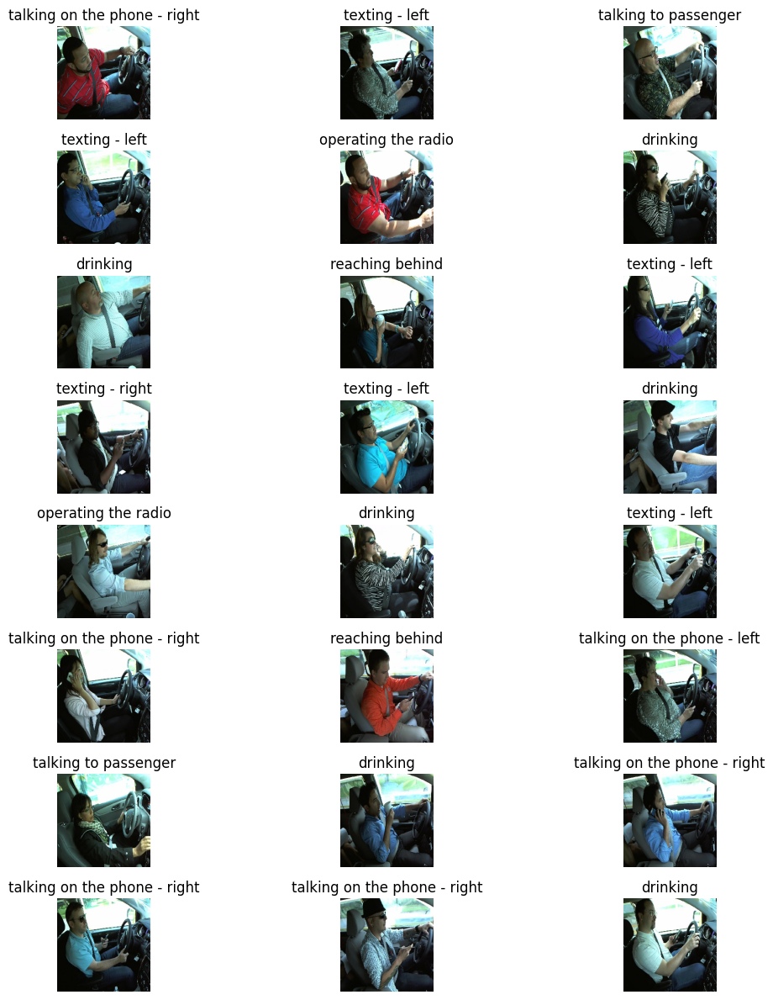

In [37]:
directory = '/kaggle/input/data001/s_test'
num_rows = len(os.listdir(directory))
num_cols = 3
fig, axs = plt.subplots(num_rows // num_cols, num_cols, figsize=(12, 12))  # Increase figsize here

# Loop through each file in the directory
for i, filename in enumerate(os.listdir(directory)):
    if filename.endswith(".jpg") or filename.endswith(".jpeg") or filename.endswith(".png"):
        # Load and preprocess the image
        img_path = os.path.join(directory, filename)
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array /= 255.  # Normalize the image

        # Predict the class probabilities
        predictions = model.predict(np.expand_dims(img_array, axis=0))
        predicted_class = np.argmax(predictions)
        predicted_label = class_names[f'c{predicted_class}']  # Retrieve class name from dictionary

        # Display the image in the grid
        row, col = divmod(i, num_cols)
        axs[row, col].imshow(img)
        axs[row, col].set_title(predicted_label)
        axs[row, col].axis('off')

plt.tight_layout()
plt.show()

In [62]:
from tensorflow.keras.optimizers import Adam

# Define the pre-trained ResNet50 model without top layers
conv_base = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze convolutional base
conv_base.trainable = False

# Create a new model on top
model = Sequential([
    conv_base,
    Flatten(),
    Dense(256, activation='relu'),
    Dense(10, activation='softmax')
])

# Compile the model with Adam optimizer
optimizer = Adam(learning_rate=0.0001)  # Specify learning rate here
model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

# Train the model
history = model.fit(train_generator_clean, steps_per_epoch=len(train_generator_clean), epochs=10, validation_data=validation_generator_clean, validation_steps=len(validation_generator_clean))


Epoch 1/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 23s 378ms/step - accuracy: 0.1436 - loss: 2.9080 - val_accuracy: 0.1875 - val_loss: 2.3366
Epoch 2/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - accuracy: 0.2257 - loss: 2.1687 - val_accuracy: 0.1964 - val_loss: 2.1469
Epoch 4/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 573us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - accuracy: 0.2770 - loss: 2.0164 - val_accuracy: 0.3393 - val_loss: 1.9977
Epoch 6/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 505us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 110ms/step - accuracy: 0.3424 - loss: 1.8989 - val_accuracy: 0.3125 - val_loss: 1.9631
Epoch 8/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 737us/step - acc

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


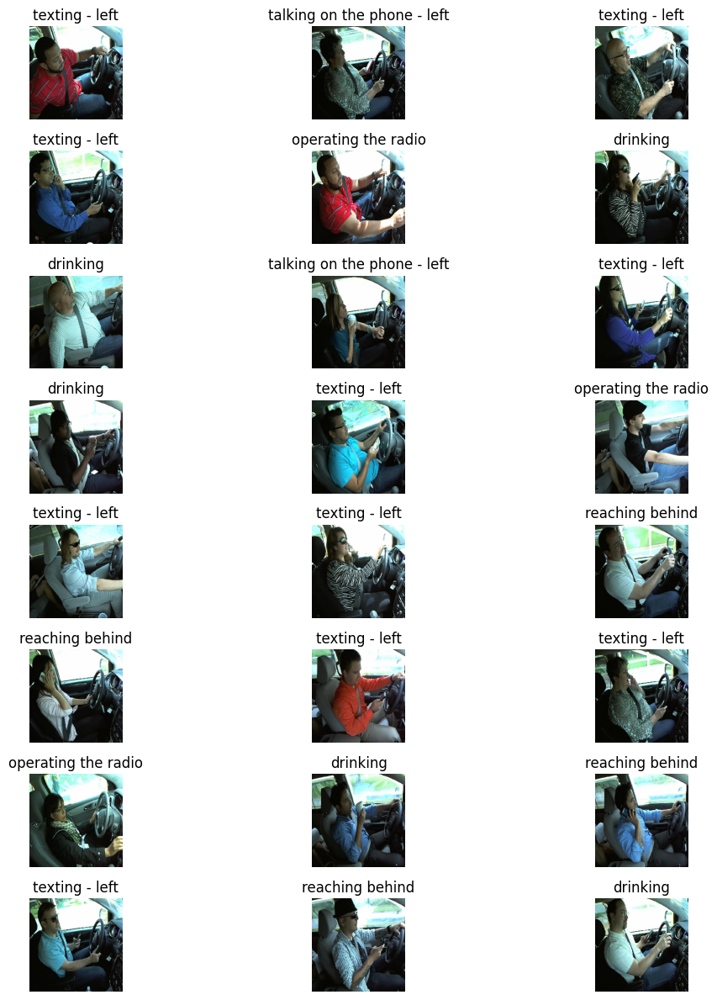

In [63]:
directory = '/kaggle/input/data001/s_test'
num_rows = len(os.listdir(directory))
num_cols = 3
fig, axs = plt.subplots(num_rows // num_cols, num_cols, figsize=(12, 12))  # Increase figsize here

# Loop through each file in the directory
for i, filename in enumerate(os.listdir(directory)):
    if filename.endswith(".jpg") or filename.endswith(".jpeg") or filename.endswith(".png"):
        # Load and preprocess the image
        img_path = os.path.join(directory, filename)
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array /= 255.  # Normalize the image

        # Predict the class probabilities
        predictions = model.predict(np.expand_dims(img_array, axis=0))
        predicted_class = np.argmax(predictions)
        predicted_label = class_names[f'c{predicted_class}']  # Retrieve class name from dictionary

        # Display the image in the grid
        row, col = divmod(i, num_cols)
        axs[row, col].imshow(img)
        axs[row, col].set_title(predicted_label)
        axs[row, col].axis('off')

plt.tight_layout()
plt.show()

In [70]:

model = tf.keras.applications.MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,
    weights="imagenet",
    input_tensor=None,
    pooling=None,
    classes=10,
    classifier_activation="softmax",
)

# Freeze the convolutional layers
for layer in model.layers:
    layer.trainable = False

# Add a new top layer
x = layers.Flatten()(model.output)
x = layers.Dense(128, activation="relu")(x)
predictions = layers.Dense(10, activation="softmax")(x)

# Create the new model
model = tf.keras.Model(inputs=model.input, outputs=predictions)

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"],
)


# Train the model with early stopping
history = model.fit(
    train_generator_clean,
    epochs=25,
    validation_data=validation_generator_clean
)

# Evaluate the model on the validation data
val_loss, val_acc = model.evaluate(validation_generator_clean)
print(f"Validation accuracy: {val_acc}")

Epoch 1/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 18s 317ms/step - accuracy: 0.1883 - loss: 23.9835 - val_accuracy: 0.1429 - val_loss: 2.1472
Epoch 2/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - accuracy: 0.2565 - loss: 1.8798 - val_accuracy: 0.2411 - val_loss: 2.1336
Epoch 3/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step - accuracy: 0.3980 - loss: 1.5228 - val_accuracy: 0.3214 - val_loss: 1.8458
Epoch 4/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 105ms/step - accuracy: 0.5260 - loss: 1.2457 - val_accuracy: 0.5179 - val_loss: 1.7150
Epoch 5/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - accuracy: 0.7123 - loss: 0.9579 - val_accuracy: 0.5625 - val_loss: 1.5051
Epoch 6/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - accuracy: 0.8270 - loss: 0.6623 - val_accuracy: 0.6786 - val_loss: 1.2609
Epoch 7/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step - accuracy: 0.9056 - loss: 0.3222 - val_accuracy: 0.6875 - val_loss: 1.2011
Epoch 8/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - accuracy: 0.9435 - loss: 0.1964 - val_accuracy: 0.723

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


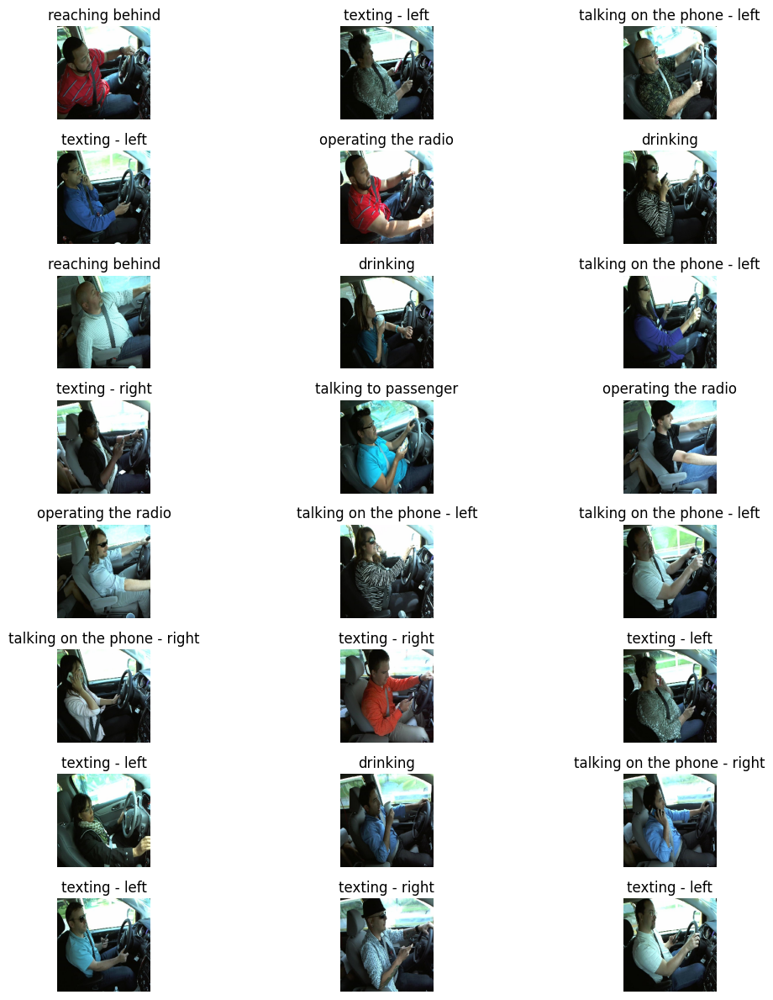

In [71]:
directory = '/kaggle/input/data001/s_test'
num_rows = len(os.listdir(directory))
num_cols = 3
fig, axs = plt.subplots(num_rows // num_cols, num_cols, figsize=(12, 12))  # Increase figsize here

# Loop through each file in the directory
for i, filename in enumerate(os.listdir(directory)):
    if filename.endswith(".jpg") or filename.endswith(".jpeg") or filename.endswith(".png"):
        # Load and preprocess the image
        img_path = os.path.join(directory, filename)
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array /= 255.  # Normalize the image

        # Predict the class probabilities
        predictions = model.predict(np.expand_dims(img_array, axis=0))
        predicted_class = np.argmax(predictions)
        predicted_label = class_names[f'c{predicted_class}']  # Retrieve class name from dictionary

        # Display the image in the grid
        row, col = divmod(i, num_cols)
        axs[row, col].imshow(img)
        axs[row, col].set_title(predicted_label)
        axs[row, col].axis('off')

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

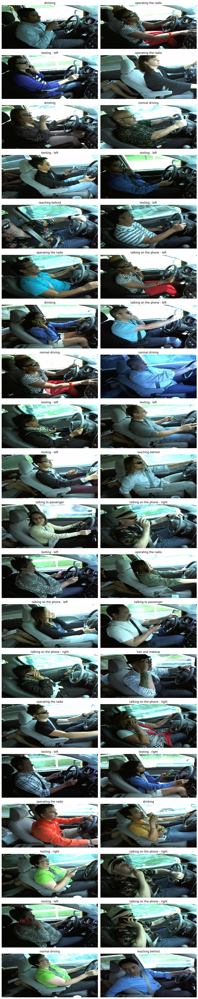

In [80]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

directory = '/kaggle/input/data00001/s_test2'
num_files = len([filename for filename in os.listdir(directory) if filename.endswith((".jpg", ".jpeg", ".png"))])
num_cols = 2
num_rows = (num_files + num_cols - 1) // num_cols  # Calculate the number of rows needed

fig, axs = plt.subplots(num_rows, num_cols, figsize=(12,60))  # Increase figsize to make images larger

# Loop through each file in the directory
for i, filename in enumerate(os.listdir(directory)):
    if filename.endswith((".jpg", ".jpeg", ".png")):
        # Load and preprocess the image
        img_path = os.path.join(directory, filename)
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array /= 255.  # Normalize the image

        # Predict the class probabilities (assuming model and class_names are defined)
        predictions = model.predict(np.expand_dims(img_array, axis=0))
        predicted_class = np.argmax(predictions)
        predicted_label = class_names[f'c{predicted_class}']  # Retrieve class name from dictionary

        # Display the image in the grid
        row, col = divmod(i, num_cols)
        axs[row, col].imshow(img, aspect='auto')  # Set aspect to 'auto' for maintaining aspect ratio
        axs[row, col].set_title(predicted_label)
        axs[row, col].axis('off')

# Hide empty subplots
for i in range(num_files, num_rows * num_cols):
    row, col = divmod(i, num_cols)
    axs[row, col].axis('off')

plt.tight_layout()
plt.show()
